<h1><center>Laboratorio 10: Interpretabilidad 🤖</center></h1>

<center><strong>MDS7202: Laboratorio de Programación Científica para Ciencia de Datos</strong></center>

### Cuerpo Docente:

- Profesor: Ignacio Meza, Sebastian Tinoco
- Auxiliar: Catherine Benavides, Consuelo Rojas
- Ayudante: Eduardo Moya, Nicolás Ojeda

### Equipo: SUPER IMPORTANTE - notebooks sin nombre no serán revisados

- Nombre de alumno 1: Diana Escobar
- Nombre de alumno 2: Matías Donoso


### **Link de repositorio de GitHub:** `https://github.com/Diana1020/Diana`

### Indice

1. [Temas a tratar](#Temas-a-tratar:)
3. [Descripcción del laboratorio](#Descripción-del-laboratorio.)
4. [Desarrollo](#Desarrollo)

## Temas a tratar

- Clasificación usando `XGBoost`.
- Métodos Agnósticos Globales de Interpretabilidad (`Partial Dependence Plot`, `Permutation Feature Importance`)
- Métodos Agnósticos Locales de Interpretabilidad (`Scoped Rules`, `SHAP`)

## Reglas:

- **Grupos de 2 personas**
- Asistencia **obligatoria** a instrucciones del lab (viernes 16.15). Luego, pueden quedarse trabajando en las salas o irse.
- **No se revisarán entregas de personas ausentes**.
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Prohibidas las copias.
- Pueden usar cualquer matrial del curso que estimen conveniente.

### Objetivos principales del laboratorio

- Generar un pipeline de clasificación con `XGBoost`.
- Implementar modelos de interpretabilidad para explicar el funcionamiento del modelo de clasificación.

El laboratorio deberá ser desarrollado sin el uso indiscriminado de iteradores nativos de python (aka "for", "while"). La idea es que aprendan a exprimir al máximo las funciones optimizadas que nos entrega `pandas`, las cuales vale mencionar, son bastante más eficientes que los iteradores nativos sobre DataFrames.

# 1. Problemas Clínicos del Dr. Simi

<p align="center">
  <img src="https://gantz.cl/wp-content/uploads/2020/01/79024136_2718114448239059_7240913062570491904_o.jpg" width="350">
</p>

El reconocido **Dr. Simi**, famoso vendedor de medicamentos en latinoamerica, debido a la creciente prevalencia de enfermedades crónicas, como la diabetes, decidió abrir una clínica especializada en el tratamiento de esta enfermedad en nuestro país.

La clínica del Doctor Simi se convirtió en un lugar donde los pacientes con diabetes podrían recibir atención médica integral. El personal médico estaba compuesto por especialistas en endocrinología, nutrición y enfermería, todos capacitados en el manejo de la diabetes.

Sin embargo él se ha dado cuenta que los tiempos han cambiado y gracias a las tecnologías es posible generar mejores predicciones en la diabetes conociendo el historial médico de las personas. Por esto, el doctor se ha colocado una meta de incluir modelos de machine learning dentro de sus clínicas, para ello le ha solicitado crear un modelo capaz de predecir/clasificar diabetes pero le rogó que el desarrollo del modelo tuviera un especial enfoque en la interpretabilidad de lo que hace su modelo.

Para que usted pueda entrenar el modelo, Dr. Simi le ha entregado un dataset de todos los clientes que fueron detectados con diabetes a lo largo de la historia de la clinica. Con ello, adjunta el historial médico de las personas en forma de datos tabulares para que usted pueda realizar fácilmente la clasificación.


In [46]:
import numpy as np
import pandas as pd

df = pd.read_csv('diabetes_data.csv')
df.head(4)

,Age,Sex,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Stroke,HighBP,Diabetes
0,4.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,5.0,30.0,0.0,0.0,1.0,0.0
1,12.0,1.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,1.0,1.0,0.0
2,13.0,1.0,0.0,1.0,26.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,10.0,0.0,0.0,0.0,0.0
3,11.0,1.0,1.0,1.0,28.0,1.0,0.0,1.0,1.0,1.0,0.0,3.0,0.0,3.0,0.0,0.0,1.0,0.0


## 2. Clasificación de pacientes con diabetes (0.5 puntos)

<p align="center">
  <img src="https://media.tenor.com/QH--g3ZaSbsAAAAC/dr-simi-abrazo.gif" width="400">
</p>

Tareas:
1. En primer lugar, el reconocido doctor le pide entrenar un modelo de `XGBoost` utilizando como target la columna `Diabetes` del dataset `diabetes_data.csv`. Para el entrenamiento tome en cuenta **todos** los pasos necesarios para entrenar un modelo de aprendizaje supervisado vistos hasta la fecha (use `Pipeline`, `ColumnTransformer`, etc.). Comente sus decisiones y los resultados obtenidos con el modelo.

2. Luego, le pide responder las siguientes preguntas:
  *  ¿Es acaso un buen predictor de diabetes?,
  * ¿Qué buscan explicar las métricas utilizadas?
  * ¿Las métricas utilizadas para medir la predictibilidad le permiten asegurar que su modelo haga una buena elección de las features?

In [2]:
!pip install xgboost

"pip" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [40]:
import plotly.express as px


binary=df.columns[df.nunique()==2].to_list()
binary.remove('Diabetes')
continuous=df.columns[df.nunique()>2].to_list()

for col in continuous:
    fig = px.histogram(df, x=col)
    fig.show()


import matplotlib.pyplot as plt
plt.hist(df['Diabetes'])
plt.show()


In [41]:

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from xgboost import XGBClassifier

X = df.drop(columns='Diabetes')
y = df['Diabetes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), continuous),
        ('cat', OneHotEncoder(), binary)
    ])

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier())
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      7090
         1.0       0.73      0.79      0.76      7049

    accuracy                           0.75     14139
   macro avg       0.75      0.75      0.75     14139
weighted avg       0.75      0.75      0.75     14139



Luego, le pide responder las siguientes preguntas:
  *  ¿Es acaso un buen predictor de diabetes? Sí, con una precisión general del 75% y un equilibrio razonable entre precisión y recall, es un predictor aceptable, ademas observar que es un dataset balanceado.
  * ¿Qué buscan explicar las métricas utilizadas? La precisión mide la proporción de verdaderos positivos entre las predicciones positivas; el recall mide la proporción de verdaderos positivos sobre el total de positivos reales; el F1-score es una media armónica entre precisión y recall, proporcionando un balance entre ambos.
  * ¿Las métricas utilizadas para medir la predictibilidad le permiten asegurar que su modelo haga una buena elección de las features? Estas métricas evalúan el rendimiento del modelo pero no garantizan la selección óptima de características.

## 3. Importancia de las features con XGBoost (0.5 puntos)

<p align="center">
  <img src="https://media.tenor.com/5JAj5_IiagEAAAAd/dr-simi-dr-simi-dance.gif" width="400">
</p>

Tareas:
1. Para añadir el toque de interpretabilidad que Dr. Simi le pide, se le pide calcular la **importancia de las features** del modelo entrenado utilizando todos los métodos (*weight*, *cover*, *gain*) que posee xgboost usando `plot_importance`.
2. ¿Los resultados obtenidos con los diferentes métodos son compatibles?, comente sus resultados y a que se debe la igualdad o desigualdad que ve en los resultados.
3. Finalmente, ¿las importancias obtenidas son suficientes para obtener la interpretabilidad de un modelo que utiliza árboles? ¿Qué debilidad presenta este método?

                     Feature Label
0                        Age    f0
1                        BMI    f1
2                    GenHlth    f2
3                   MentHlth    f3
4                   PhysHlth    f4
5                    Sex_0.0    f5
6                    Sex_1.0    f6
7               HighChol_0.0    f7
8               HighChol_1.0    f8
9              CholCheck_0.0    f9
10             CholCheck_1.0   f10
11                Smoker_0.0   f11
12                Smoker_1.0   f12
13  HeartDiseaseorAttack_0.0   f13
14  HeartDiseaseorAttack_1.0   f14
15          PhysActivity_0.0   f15
16          PhysActivity_1.0   f16
17                Fruits_0.0   f17
18                Fruits_1.0   f18
19               Veggies_0.0   f19
20               Veggies_1.0   f20
21     HvyAlcoholConsump_0.0   f21
22     HvyAlcoholConsump_1.0   f22
23              DiffWalk_0.0   f23
24              DiffWalk_1.0   f24
25                Stroke_0.0   f25
26                Stroke_1.0   f26
27                Hi

<Figure size 1000x800 with 0 Axes>

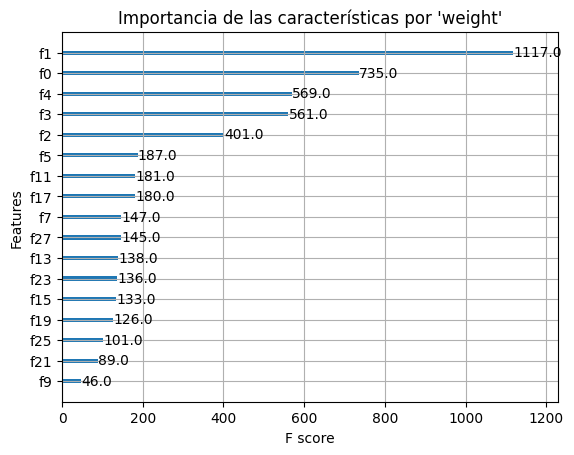

<Figure size 1000x800 with 0 Axes>

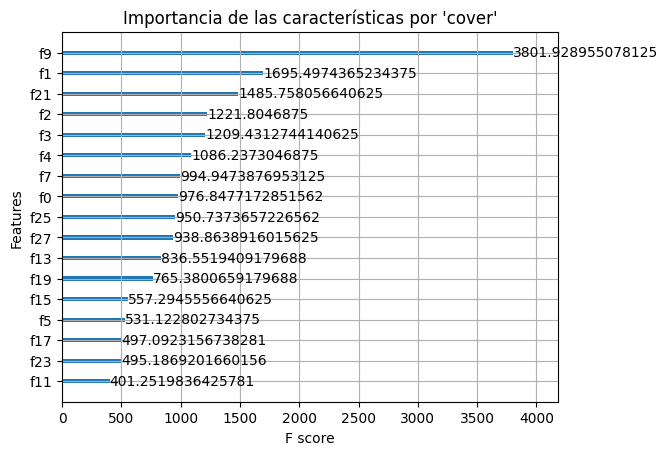

<Figure size 1000x800 with 0 Axes>

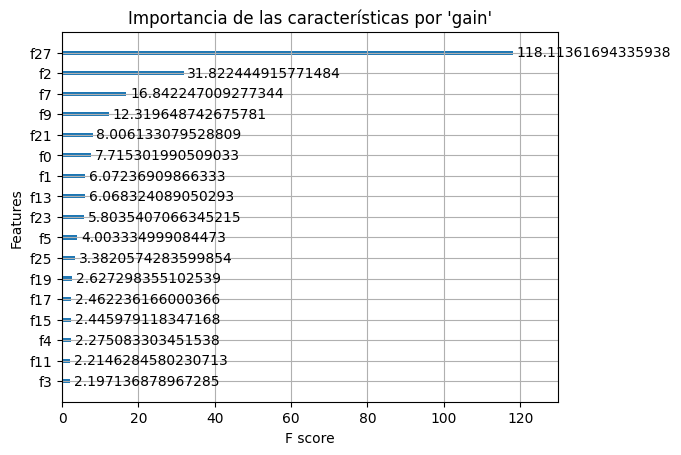

In [53]:
# Inserte su código aquí    
from xgboost import plot_importance

xgb_model = pipeline.named_steps['classifier']

# Obtener nombres de las características transformadas
cat_features = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(binary)
all_features = list(continuous) + list(cat_features)

# Crear un DataFrame para mapear las etiquetas a las características
feature_mapping = pd.DataFrame({
    'Feature': all_features,
    'Label': [f'f{i}' for i in range(len(all_features))]
})

# Mostrar el mapeo
print(feature_mapping)

# Plot de la importancia de las características por 'weight'
plt.figure(figsize=(10, 8))
plot_importance(xgb_model, importance_type='weight')
plt.title("Importancia de las características por 'weight'")
plt.show()

# Plot de la importancia de las características por 'cover'
plt.figure(figsize=(10, 8))
plot_importance(xgb_model, importance_type='cover')
plt.title("Importancia de las características por 'cover'")
plt.show()

# Plot de la importancia de las características por 'gain'
plt.figure(figsize=(10, 8))
plot_importance(xgb_model, importance_type='gain')
plt.title("Importancia de las características por 'gain'")
plt.show()

1. Los resultados obtenidos con los diferentes métodos no son completamente iguales. Esto se debe a que weight mide la frecuencia de uso de las características en los árboles, cover mide el impacto en el número de muestras, y gain mide la mejora en la precisión. Las diferencias reflejan la naturaleza distinta de cada métrica y cómo cada característica contribuye de manera diferente según el criterio evaluado.
2. Las importancias obtenidas proporcionan una buena indicación de las características relevantes en el modelo, pero no son suficientes para interpretar completamente el modelo. Este método no captura interacciones complejas ni relaciones no lineales entre características, lo que es una debilidad significativa para una mejor interpretabilidad.

## 4. Métodos Agnósticos Globales (1.0 puntos)

<p align="center">
  <img src="https://media.tenor.com/JcRHtjVuXN8AAAAC/dr-simi-farmacias-similares.gif" width="400">
</p>

Tareas:
1. Para mitigar los problemas encontrados en la sección anterior, Dr. Simi le pide implementar un **método de permutación** que le permita observar la importancia de las features.
2. Visualice los resultados de este método en un gráfico.
3. Para que su modelo sea consistente, repita el proceso **30 veces** y verifique la desviación estándar de sus resultados (¿Qué señala está?).
4. Además, responda las siguientes preguntas:
  - ¿Cómo mide la importancia de las features su propuesta?
  - ¿Qué features tienen un mayor impacto en la salida del modelo?. Comente las 5 primeras, ¿tienen sentido?
  - ¿Cómo cambian sus conclusiones con respecto a las features importances del punto anterior?
  - Nombre y explique 3 ventajas y 3 desventajas del método implementado.

[0.0021241  0.00115049 0.00156482 0.00052973 0.00218419 0.00056679
 0.00080717 0.00060332 0.00079242 0.00077325 0.00077103 0.00276211
 0.00109811 0.00139095 0.00100195 0.0006267  0.00143055]


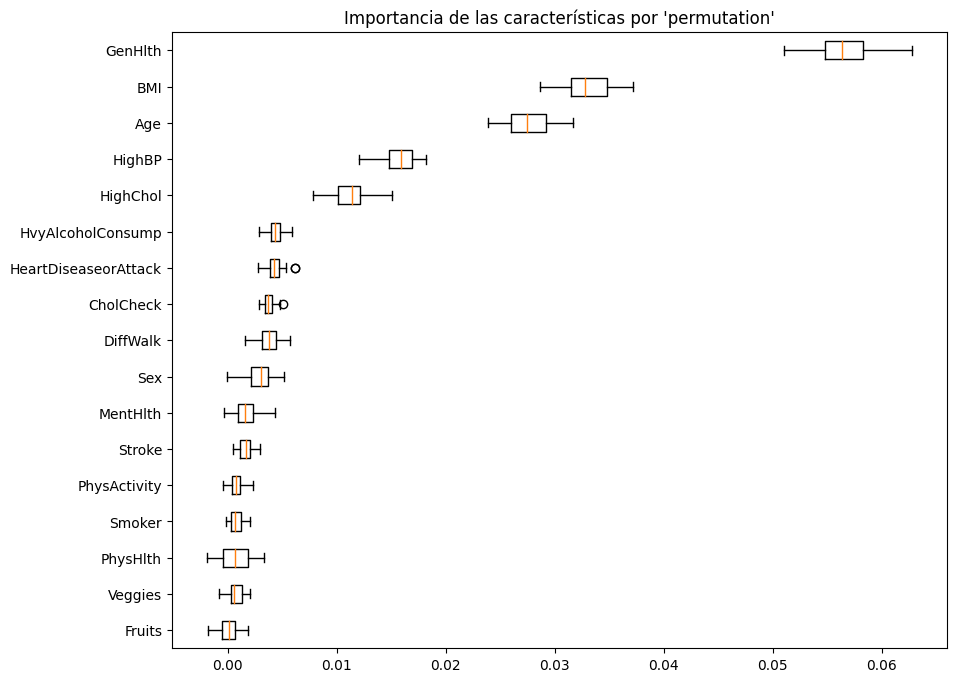

In [60]:
# Inserte su código aquí

from sklearn.inspection import permutation_importance

result = permutation_importance(pipeline, X_test, y_test, n_repeats=30, random_state=42)

plt.figure(figsize=(10, 8))
sorted_idx = result.importances_mean.argsort()
plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=X_test.columns[sorted_idx])
plt.title("Importancia de las características por 'permutation'")
plt.show()


print(result.importances_std)



Además, responda las siguientes preguntas:
  - ¿Cómo mide la importancia de las features su propuesta? 
  
  Mide la importancia de las características al permutar aleatoriamente los valores de cada característica y observar la disminución en la precisión del modelo. De esta forma se ve el impacto de cada característica en la predicción.
  - ¿Qué features tienen un mayor impacto en la salida del modelo?. Comente las 5 primeras, ¿tienen sentido? 
  
  Las características con mayor impacto en la salida del modelo son GenHlth, BMI, Age, HighBP, y HighChol. Tienen sentido ya que están directamente relacionadas con factores de salud los cuales son importantes en la predicción de la diabetes.
  - ¿Cómo cambian sus conclusiones con respecto a las features importances del punto anterior?

 Cambian ligeramente, ya que métodos como gain, cover, y weight destacaban características como HighBP y HighChol, pero no tanto GenHlth. Ahora, con el método de permutación, GenHlth resulta ser la característica más importante, luego viene BMI y Age.
  - Nombre y explique 3 ventajas y 3 desventajas del método implementado.


Como ventajas se tiene que mide cómo la permutación de cada característica afecta la precisión del modelo, también es aplicable a diversos modelos sin depender de sus estructuras internas, por últomo, logra identifica características importantes en combinación con otras.

En desventajas se tiene que es computacionalmente costoso con conjuntos grandes de datos, puede llevar a interpretaciones incorrectas si los datos contienen mucho ruido, por último, resultados pueden variar con diferentes conjuntos de prueba.

## 5. Métodos Agnósticos Locales (2.0 puntos)

<p align="center">
  <img src="https://i.makeagif.com/media/1-27-2017/fBrzT8.mp4" width="400">
</p>

### 5.1 Calculando Shap Values (0.4 puntos)

Tareas:
1. Alegre por saber cómo funciona el modelo de predicción a nivel general, Dr. Simi le pide ahora interpretar las predicciones de su modelo a nivel de paciente (es decir, desde un punto de vista **local**). Para esto, el ilustre farmacéutico le pide calcular los *shap values* de su modelo.
2. ¿Qué representa cada número en su resultado? 
3. ¿Es posible atribuir un significado a la positividad/negatividad de cada valor?

In [74]:
%pip install shap

   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   --------------------------------------  450.6/455.5 kB 14.2 MB/s eta 0:00:01
   ---------------------------------------- 455.5/455.5 kB 7.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [71]:
import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

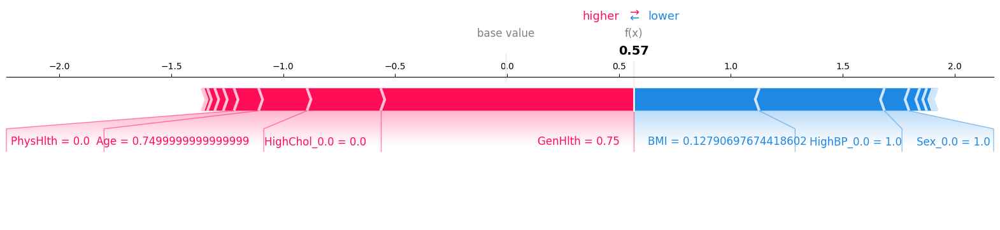

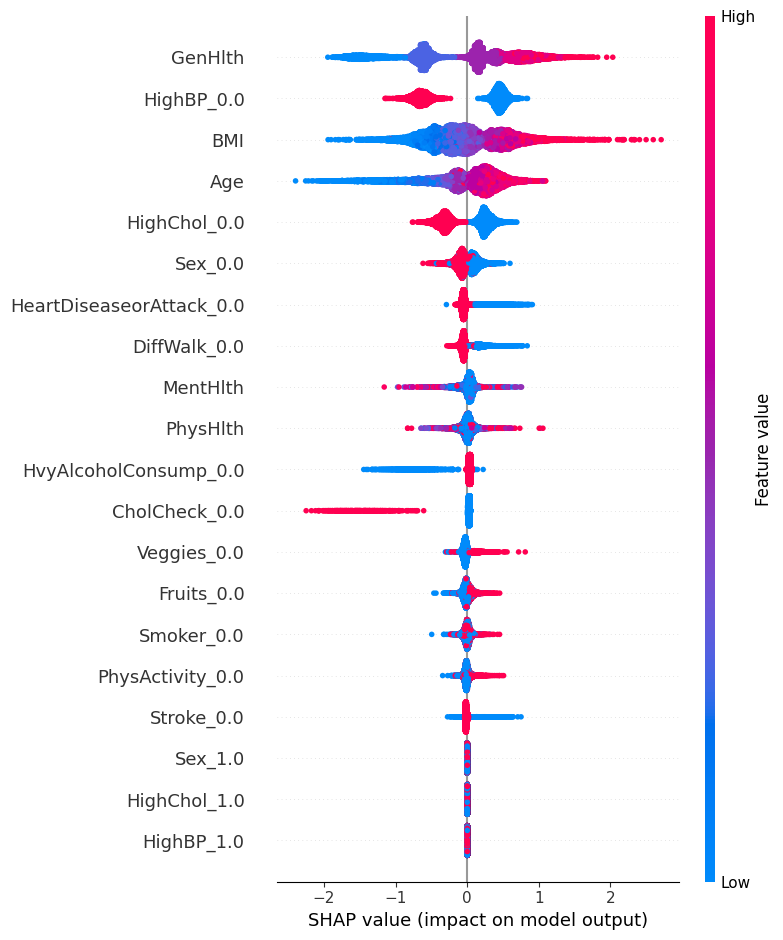

In [79]:
# Inserte código para calcular shapley values aquí
import shap
import matplotlib.pyplot as plt

pipeline.fit(X_train, y_train)

xgb_model = pipeline.named_steps['classifier']

X_test_transformed = pipeline.named_steps['preprocessor'].transform(X_test)

explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test_transformed)
cat_features = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(binary)
all_features = list(continuous) + list(cat_features)

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test_transformed[0, :], feature_names=all_features, matplotlib=True)

shap.summary_plot(shap_values, X_test_transformed, feature_names=all_features)


- ¿Qué representa cada número en su resultado? Los números en los resultados de SHAP representan cuánto cada característica contribuye a la predicción final del modelo. El base value es la predicción promedio antes de considerar las características, mientras que f(x) es la predicción ajustada por las contribuciones individuales de cada característica.
- ¿Es posible atribuir un significado a la positividad/negatividad de cada valor? Sí, un valor SHAP positivo indica que la característica aumenta la predicción del modelo, mientras que uno negativo indica que la característica disminuye la predicción. Esto ayuda a entender cómo cada característica influye en la dirección de la predicción.



### 5.2 Aporte local (0.4 puntos)


1. Usando los *shap values* calculados, grafique el **aporte** de las diferentes variables para las instancias **1**, **9** y **150**, interprete sus resultados y responda:

  - ¿Qué variables afectan de manera positiva/negativa a la probabilidad de poseer diabetes?

  - ¿Existe algún patrón común entre las instancias analizadas?

  - ¿Es posible generalizar estas conclusiones a todo el dataset?

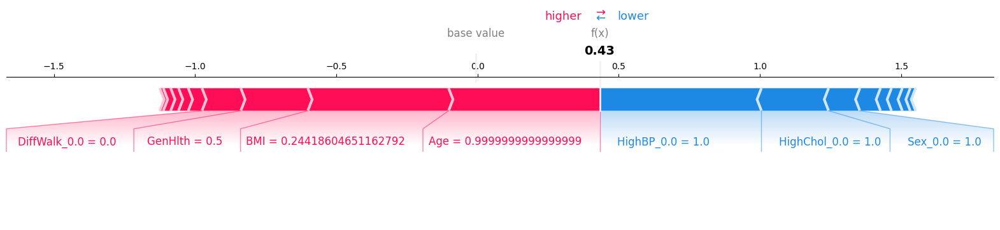

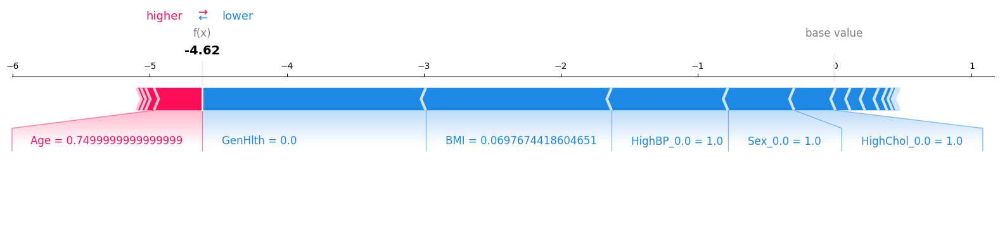

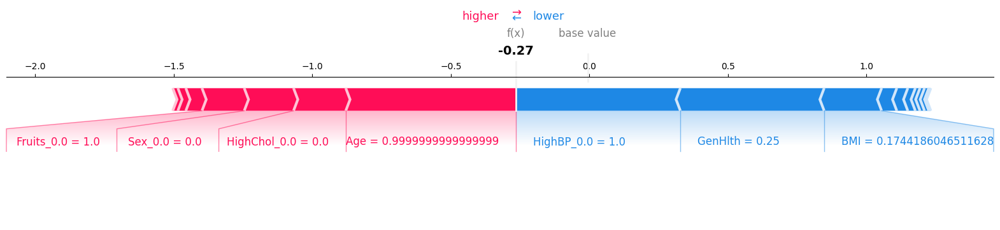

In [80]:
# Inserte código para generar gráficos de aporte local aquí
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1], X_test_transformed[1, :], feature_names=all_features, matplotlib=True)

# Visualizar los valores SHAP para la instancia 9
shap.force_plot(explainer.expected_value, shap_values[9], X_test_transformed[9, :], feature_names=all_features, matplotlib=True)

# Visualizar los valores SHAP para la instancia 150
shap.force_plot(explainer.expected_value, shap_values[150], X_test_transformed[150, :], feature_names=all_features, matplotlib=True)


-  ¿Qué variables afectan de manera positiva/negativa a la probabilidad de poseer diabetes?

Las variables que afectan positivamente son Age, GenHlth, y BMI aumentan la probabilidad de tener diabetes. Las variables que afectan negativamente son  HighBP, HighChol, y Sex (hombres) tienden a disminuir la probabilidad de diabetes en las instancias analizadas.

 - ¿Existe algún patrón común entre las instancias analizadas?

Age y GenHlth son importantes en todas las instancias, lo cual significa que son factores críticos.

  - ¿Es posible generalizar estas conclusiones a todo el dataset?

Aunque estos patrones son observables en las instancias analizadas, no se puede generalizar completamente a todo el dataset, ya que los valores SHAP proporcionan interpretaciones locales.

### 5.3 Aporte global (0.4 puntos)

Genere ahora una visualización donde se grafique el aporte de cada feature a nivel **global** e interprete sus resultados. ¿Qué diferencias existen con las conclusiones generadas a nivel de instancia?

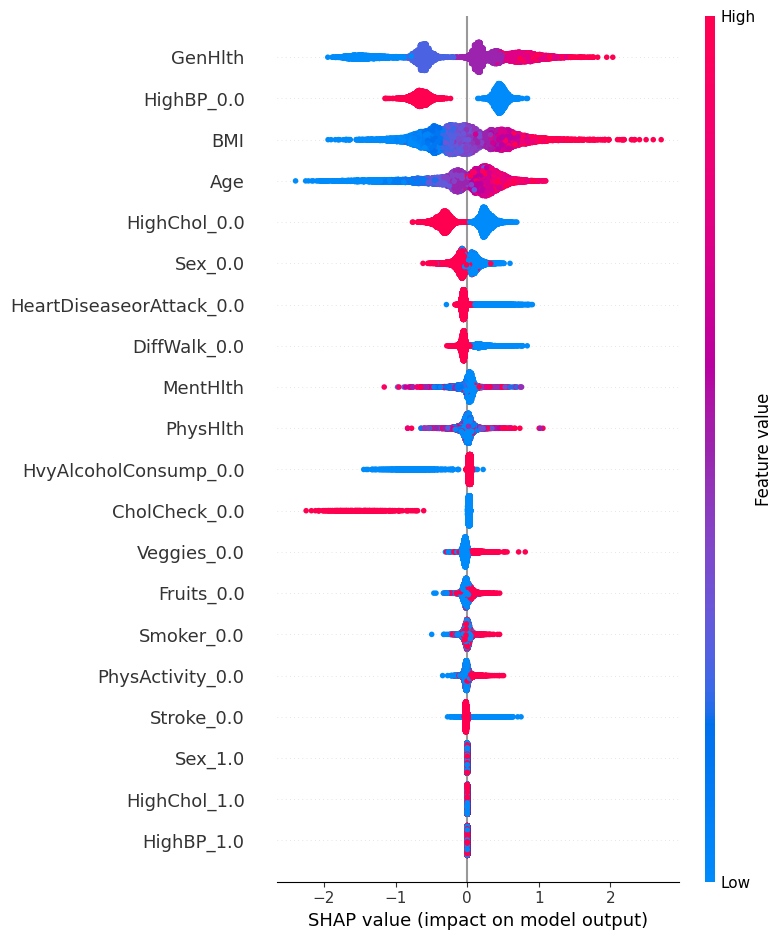

In [81]:
# Inserte código para generar gráficos de aporte global aquí

shap.summary_plot(shap_values, X_test_transformed, feature_names=all_features)

A nivel global, el gráfico de resumen muestra la importancia promedio de cada característica en todas las predicciones, destacando GenHlth, HighBP_0.0, y BMI como las más influyentes, siendo que antes a nivel local, las conclusiones se centran en cómo características específicas afectan las predicciones individuales, mostrando variaciones en cada paciente.


### 5.4 Scatter plot (0.4 puntos)


Grafique ahora un *scatterplot* entre los *shap values* y las primeras 5 features con mayor impacto global (un gráfico por cada feature), coloreando cada punto por la probabilidad de tener diabetes. ¿Qué puede concluir de sus resultados?

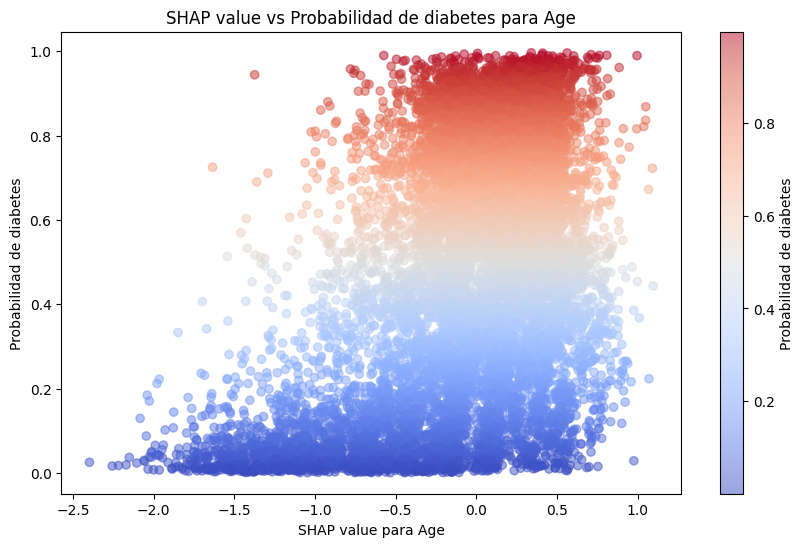

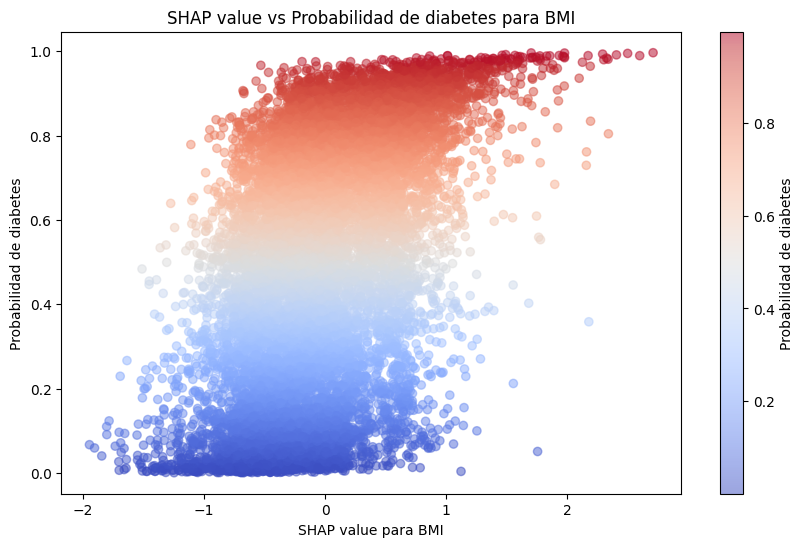

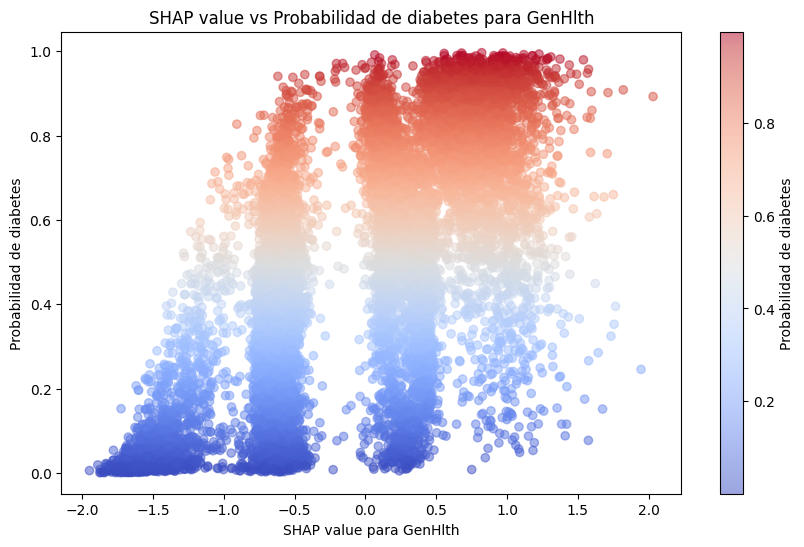

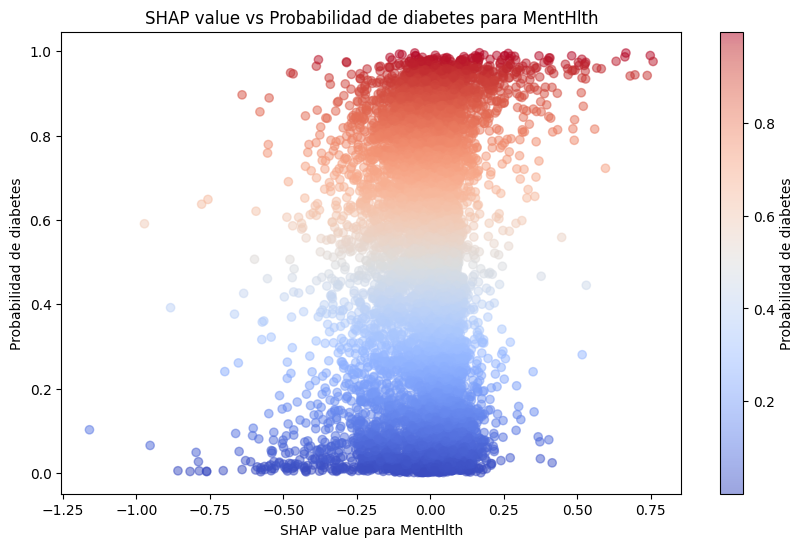

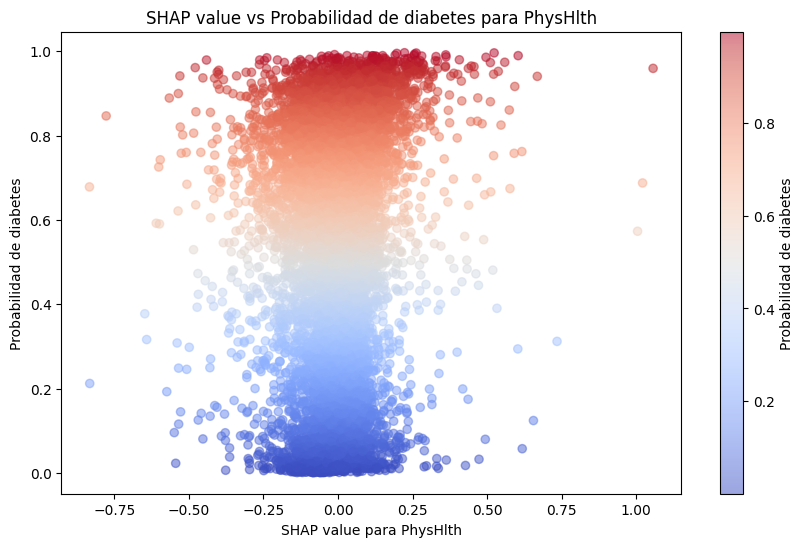

In [83]:
# Inserte código para generar gráficos de feature vs shap value aquí

probabilities = xgb_model.predict_proba(X_test_transformed)[:, 1]

shap_df = pd.DataFrame(shap_values, columns=all_features)
shap_df['Probability'] = probabilities

top_features = shap_df.columns[:5]

for feature in top_features:
    plt.figure(figsize=(10, 6))
    plt.scatter(shap_df[feature], shap_df['Probability'], c=shap_df['Probability'], cmap='coolwarm', alpha=0.5)
    plt.colorbar(label='Probabilidad de diabetes')
    plt.xlabel(f'SHAP value para {feature}')
    plt.ylabel('Probabilidad de diabetes')
    plt.title(f'SHAP value vs Probabilidad de diabetes para {feature}')
    plt.show()


- Las características Age, BMI, y GenHlth muestran una correlación positiva con la probabilidad de tener diabetes, es decir, valores más altos en estas características tienden a aumentar la probabilidad de diabetes. 
- Tanto MentHlth como PhysHlth también tienen un impacto en la probabilidad de diabetes, indicando que la salud fisica y mental son factores importantes.
- La coloración de los puntos muestra una clara diferenciación en la probabilidad de diabetes basada en los valores SHAP, con una transición gradual de azul a rojo  conforme aumentan los valores SHAP. 


### 5.5 Partial Dependence Plot (0.4 puntos)

Finalmente, se le pide generar un gráfico del tipo Partial Dependence Plot para las mismas 5 variables con mayor impacto global usando una submuestra de 1000 observaciones. ¿Qué relación existe entre la salida promedio del modelo y cada feature analizada? ¿Son estas conclusiones generalizables para todo el conjunto de datos?

In [85]:
# Inserte código para generar gráficos PDP aquí
from sklearn.inspection import plot_partial_dependence
from sklearn.ensemble import GradientBoostingClassifier

subsample_indices = np.random.choice(X_test_transformed.shape[0], 1000, replace=False)

X_test_subsample = X_test_transformed[subsample_indices]
y_test_subsample = y_test.iloc[subsample_indices]

gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)

cat_features = pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(binary)
all_features = list(continuous) + list(cat_features)

top_features = ['GenHlth', 'HighBP_0.0', 'BMI', 'Age', 'HighChol_0.0']

fig, ax = plt.subplots(len(top_features), 1, figsize=(10, 20))

for i, feature in enumerate(top_features):
    plot_partial_dependence(gb_model, X_test_subsample, [all_features.index(feature)], ax=ax[i], feature_names=all_features)
    ax[i].set_title(f'Partial Dependence Plot para {feature}')
    
plt.tight_layout()
plt.show()

ImportError: cannot import name 'plot_partial_dependence' from 'sklearn.inspection' (c:\Users\diana\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\inspection\__init__.py)

     ---------------------------------------- 0.0/43.8 kB ? eta -:--:--
     ---------------------------------------- 43.8/43.8 kB 2.1 MB/s eta 0:00:00
     ---------------------------------------- 0.0/109.0 kB ? eta -:--:--
     -------------------------------------- 109.0/109.0 kB 6.6 MB/s eta 0:00:00
     ---------------------------------------- 0.0/42.0 kB ? eta -:--:--
     ---------------------------------------- 42.0/42.0 kB 2.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/522.1 kB ? eta -:--:--
   --------------------------------------- 522.1/522.1 kB 16.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/6.6 MB ? eta -:--:--
   ------- -------------------------------- 1.2/6.6 MB 40.0 MB/s eta 0:00:01
   ---------- ----------------------------- 1.7/6.6 MB 18.4 MB/s eta 0:00:01
   ----------------- ---------------------- 2.8/6.6 MB 22.5 MB/s eta 0:00:01
   ------------------- -------------------- 3.1/6.6 MB 22.2 MB/s eta 0:00:01
   ------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


## 6. Sistema de Reglas! (1.0 punto)

<p align="center">
  <img src="https://media.baamboozle.com/uploads/images/125978/1638281150_1380186_gif-url.gif" width="400">
</p>

Después de todo el trabajo hecho, Dr. Simi le pide simplificar el funcionamiento de su modelo en un sistema de reglas que le permita explicar a sus clientes las predicciones que genera su modelo. En particular, Dr. Simi le pide explicar la decisión tomada para las observaciones **1000**, **3001** y **5751**. Con las reglas propuestas señale a **cuánta población** es posible explicar con estas reglas e indique la **precisión** que poseen las reglas en la totalidad de los datos. ¿Tienen sentido sus reglas propuestas para las observaciones?. Fundamente sus respuesta señalando el impacto que tienen sus reglas sobre todo el conjunto de datos.

In [84]:
%pip install alibi

^C
Note: you may need to restart the kernel to use updated packages.


In [86]:
from alibi.explainers import AnchorTabular

In [88]:
# Inserte su código para generar sistema de reglas aquí

observations = [1000, 3001, 5751]
predictions = xgb_model.predict(X_test_transformed[observations])
shap_values_observations = shap_values[observations]

def formulate_rules(observation_index):
    feature_impact = sorted(zip(all_features, shap_values_observations[observation_index]), key=lambda x: abs(x[1]), reverse=True)
    rules = []
    for feature, impact in feature_impact[:3]:  
        if impact > 0:
            rules.append(f"{feature} high")
        else:
            rules.append(f"{feature} low")
    return rules

def matches_rules(rules, shap_values, threshold=0):
    for rule in rules:
        feature, condition = rule.split(' ')
        feature_index = all_features.index(feature)
        if condition == 'high' and shap_values[feature_index] <= threshold:
            return False
        if condition == 'low' and shap_values[feature_index] >= -threshold:
            return False
    return True

def evaluate_rules(rules):
    matches = [i for i, shap_val in enumerate(shap_values) if matches_rules(rules, shap_val)]
    coverage = len(matches) / len(shap_values)
    correct_predictions = sum((xgb_model.predict(X_test_transformed[[i]])[0] == y_test.iloc[i]) for i in matches)
    precision = correct_predictions / len(matches) if matches else 0
    return coverage, precision


idx = 1000
# explicar predicción idx 1000
rules_1000 = formulate_rules(0)
coverage_1000, precision_1000 = evaluate_rules(rules_1000)
print(f"Reglas para la observación {idx}: {rules_1000}")
print(f"Cobertura: {coverage_1000*100:.2f}%, Precisión: {precision_1000*100:.2f}%")


idx = 3001
# explicar predicción idx 3001
rules_3001 = formulate_rules(1)
coverage_3001, precision_3001 = evaluate_rules(rules_3001)
print(f"Reglas para la observación {idx}: {rules_3001}")
print(f"Cobertura: {coverage_3001*100:.2f}%, Precisión: {precision_3001*100:.2f}%")

idx = 5751
# explicar predicción idx 5751

rules_5751 = formulate_rules(2)
coverage_5751, precision_5751 = evaluate_rules(rules_5751)
print(f"Reglas para la observación {idx}: {rules_5751}")
print(f"Cobertura: {coverage_5751*100:.2f}%, Precisión: {precision_5751*100:.2f}%")

Reglas para la observación 1000: ['GenHlth low', 'HighBP_0.0 high', 'Age high']
Cobertura: 10.59%, Precisión: 64.86%
Reglas para la observación 3001: ['BMI high', 'Age low', 'HighBP_0.0 high']
Cobertura: 10.36%, Precisión: 72.97%
Reglas para la observación 5751: ['HighBP_0.0 low', 'GenHlth low', 'HighChol_0.0 high']
Cobertura: 6.99%, Precisión: 76.14%


Observación 1000: Sugieren que una mala salud (GenHlth baja) y la edad avanzada incrementan la probabilidad de diabetes. La presión arterial alta (HighBP_0.0 alta) también es un factor de riesgo conocido.
La cobertura del 10.59% indica que estas reglas se aplican a una parte significativa de la población, con una precisión del 64.86%.

Observación 3001: Un índice de masa corporal alto (BMI alto) y presión arterial alta (HighBP_0.0 alta) son factores de riesgo, mientras que la edad baja puede parecer incoherente pero puede implicar una predisposición genética o factores de estilo de vida.
La cobertura del 10.36% y una precisión alta del 72.97% indican que estas reglas son efectivas y aplicables a una parte considerable del conjunto de datos.

Observación 5751: La baja presión arterial (HighBP_0.0 baja) combinada con mala salud  (GenHlth baja) y colesterol alto (HighChol_0.0 alto) reflejan un perfil de riesgo significativo.
La cobertura del 6.99% es menor, pero la precisión del 76.14% indica que estas reglas son muy precisas para predecir diabetes en estos casos.

# Retrospectiva... (1.0 puntos)

En base a los diferentes métodos que implementa y ha comentado en este laboratorio, comente qué métodos le permiten entregar mejores conclusiones para la tarea de clasificación de diabetes. Por otro lado, ¿qué métodos son más útiles para el problema del doctor Simi, métodos agnosticos locales o globales?

> Para la clasificación de diabetes, los métodos que proporcionan mejores conclusiones son los valores SHAP, tanto a nivel local como global, y los Partial Dependence Plots (PDP). Los métodos agnósticos locales, como los valores SHAP locales y las reglas derivadas de SHAP, son especialmente útiles para el problema del doctor Simi, ya que permiten explicar de manera clara y específica las predicciones individuales a los clientes.

# Conclusión
Eso ha sido todo para el lab de hoy, recuerden que el laboratorio tiene un plazo de entrega de una semana. Cualquier duda del laboratorio, no duden en contactarnos por mail o U-cursos.

![Gracias Totales!](https://media.tenor.com/ctnq4bhZE3gAAAAC/drsimi-simi.gif)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=87110296-876e-426f-b91d-aaf681223468' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>